# Generacja zdjęć twarzy oraz dokumentów

### Zasada działania
1. Potrzebne repozytorium z GAN-Control jest klonowane do folderu /content notebook'a. Następnie pobierany jest folder resources z niezbędnymi plikami do działania algorytmów (https://drive.google.com/file/d/1QXbL0MWRTOG64qOZ5XIn2zrYabpbKeaM/view?usp=drive_link).
1. GAN-Control (https://alonshoshan10.github.io/gan_control/) generuje dwa zdjęcia twarzy tej samej osoby.
2. Na podstawie tych zdjęć tworzone są dwa nowe zdjęcia na podstawie poprzednich, ale tym razem osoba na nich ma konkretną pozę, mimikę twarzy, naświetlenie.
3. Ze zdjęć do dokumentów wycinane jest tło przy pomocy modułu rembg.
4. Do poprawnego wygenerowania danych osobowych "sztucznego" człowieka należy dowiedzieć się jaką ma płeć. Niestety GAN-control nie pozwala explicite na kontrolowanie tej cechy. Ten problem jest obchodzony przez prostą detekcję płci przy użyciu dedykowanego modelu i openCV.
5. Syntetyczne dane do dokumentów są generowane przez moduł faker.

In [1]:
!git clone https://github.com/amazon-science/gan-control.git

Cloning into 'gan-control'...
remote: Enumerating objects: 228, done.
remote: Counting objects: 100% (17/17), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 228 (delta 6), reused 6 (delta 3), pack-reused 211
Receiving objects: 100% (228/228), 65.54 MiB | 15.23 MiB/s, done.
Resolving deltas: 100% (46/46), done.
Updating files: 100% (181/181), done.


In [2]:
!gdown 1QXbL0MWRTOG64qOZ5XIn2zrYabpbKeaM

Downloading...
From (original): https://drive.google.com/uc?id=1QXbL0MWRTOG64qOZ5XIn2zrYabpbKeaM
From (redirected): https://drive.google.com/uc?id=1QXbL0MWRTOG64qOZ5XIn2zrYabpbKeaM&confirm=t&uuid=71b73fa8-c06b-454e-be8b-bc109f8a3013
To: /content/resources.zip
100% 912M/912M [00:15<00:00, 60.5MB/s]


In [3]:
!unzip '/content/resources.zip' -d '/content/resources'
!rm resources.zip

Archive:  /content/resources.zip
  inflating: /content/resources/age_net.caffemodel  
  inflating: /content/resources/document_template.jpg  
  inflating: /content/resources/gender_deploy.prototxt  
  inflating: /content/resources/gender_net.caffemodel  
  inflating: /content/resources/Lato-Black.ttf  
  inflating: /content/resources/opencv_face_detector.pbtxt  
  inflating: /content/resources/opencv_face_detector_uint8.pb  
  inflating: /content/resources/passport_template.jpg  
   creating: /content/resources/controller_age015id025exp02hai04ori02gam15/
  inflating: /content/resources/controller_age015id025exp02hai04ori02gam15/.DS_Store  
  inflating: /content/resources/controller_age015id025exp02hai04ori02gam15/._.DS_Store  
  inflating: /content/resources/controller_age015id025exp02hai04ori02gam15/._age_loss_20201013-061438  
  inflating: /content/resources/controller_age015id025exp02hai04ori02gam15/._expression_loss_20201104-093349  
  inflating: /content/resources/controller_age01

In [4]:
resources_path = "/content/resources"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [5]:
!pip install faker
!pip install rembg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.8/6.8 MB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 9.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 13.3 MB/s eta 0:00:00


In [6]:
import os
import torch
import torchvision.transforms as T
from PIL import Image, ImageOps, ImageDraw, ImageFont, ImageEnhance
import pandas as pd
import numpy as np
import sys
import cv2
from faker import Faker
from rembg import remove
import random
import string
import datetime
import cv2
import matplotlib.pyplot as plt

In [7]:
def save_images(image_tensors, person_number):
    transform = T.ToPILImage()
    for photo_number, image_tensor in enumerate(image_tensors):
        image = transform(image_tensor)
        image.save(f"output/photo_{person_number}_{photo_number}.png")


def fake_document_code():
    letters = ''.join(random.choices(string.ascii_lowercase, k=3))
    digits = ''.join(random.choices(string.digits, k=6))
    code = f"{letters} {digits}"
    return code


def fake_can_code():
    digits = ''.join(random.choices(string.digits, k=6))
    code = f"{digits}"
    return code


def images_from_tensors(image_tensors):
    images = []
    to_pil = T.ToPILImage()
    resize = T.Resize(450)
    for image_tensor in image_tensors:
        images.append(resize(to_pil(image_tensor)))
    return images


def gender_detect(image):
    face1 = f"{resources_path}/opencv_face_detector.pbtxt"
    face2 = f"{resources_path}/opencv_face_detector_uint8.pb"
    gen1 = f"{resources_path}/gender_deploy.prototxt"
    gen2 = f"{resources_path}/gender_net.caffemodel"
    MODEL_MEAN_VALUES = (78.4263377603, 87.7689143744, 114.895847746)
    face = cv2.dnn.readNet(face2, face1)
    genderNet = cv2.dnn.readNet(gen2, gen1)
    genders = ['male', 'female']
    image_h = image.shape[0]
    image_w = image.shape[1]
    blob = cv2.dnn.blobFromImage(image, 1.0, (300, 300), [104, 117, 123], True, False)
    face.setInput(blob)
    detections = face.forward()
    faceBoxes = []
    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]
        if confidence > 0.7:
            x1 = int(detections[0, 0, i, 3]*image_w)
            y1 = int(detections[0, 0, i, 4]*image_h)
            x2 = int(detections[0, 0, i, 5]*image_w)
            y2 = int(detections[0, 0, i, 6]*image_h)
            faceBoxes.append([x1, y1, x2, y2])
    if not faceBoxes:
        print("No face detected")
    faceBox = faceBoxes[0]
    face = image[max(0, faceBox[1] - 15):
                  min(faceBox[3] + 15, image.shape[0] - 1),
                  max(0, faceBox[0] - 15):min(faceBox[2] + 15,
                                image.shape[1] - 1)]
    blob = cv2.dnn.blobFromImage(
        face, 1.0, (227, 227), MODEL_MEAN_VALUES, swapRB=False)
    genderNet.setInput(blob)
    genderPreds = genderNet.forward()
    gender = genders[genderPreds[0].argmax()]

    return gender


def add_info_for_document(document_image, document_template, passport_image, passport_template, person_number, fake):
    cv_image = cv2.cvtColor(np.array(document_image), cv2.COLOR_RGB2BGR)
    width, height = document_image.size
    document_image = document_image.resize((int(width * 0.8), int(height * 0.8)))
    document_image = remove(document_image, bgcolor=[255, 255, 255, 255]).crop((50 - 10, 0, 400 * 0.8 - 10, 450 * 0.8))
    document_image = ImageOps.grayscale(document_image)
    document_template.paste(document_image, (110, 230))
    draw_image = ImageDraw.Draw(document_template)
    font = ImageFont.truetype(f"{resources_path}/Lato-Black.ttf", 40)
    gender = 'M' if gender_detect(cv_image) == 'male' else 'K'
    last_name = fake.last_name()
    draw_image.text((450, 170), last_name.upper(), font=font, fill=(0, 0, 0))
    first_name = fake.first_name_male() if gender == 'M' else fake.first_name_female()
    draw_image.text((450, 250), first_name.upper(), font=font, fill=(0, 0, 0))
    draw_image.text((450, 340), "POLSKIE", font=font, fill=(0, 0, 0))
    draw_image.text((450, 430), fake_document_code().upper(), font=font, fill=(0, 0, 0))
    expiry_date = fake.date_this_decade(after_today=True)
    draw_image.text((450, 510), f"{expiry_date.day}.{expiry_date.month}.{expiry_date.year}", font=font, fill=(0, 0, 0))
    birth_date = fake.date_object(end_datetime=datetime.date(2000, 1, 1))
    draw_image.text((800, 340), f"{birth_date.day}.{birth_date.month}.{birth_date.year}", font=font, fill=(0, 0, 0))
    draw_image.text((800, 430), gender, font=font, fill=(0, 0, 0))
    draw_image.text((940, 600), fake_can_code(), font=font, fill=(0, 0, 0))
    small_document_image = document_image.copy()
    width, height = small_document_image.size
    small_document_image = document_image.resize((int(width * 0.5), int(height * 0.45)))
    small_document_image = ImageEnhance.Brightness(small_document_image)
    small_document_image = small_document_image.enhance(1.4)
    document_template.paste(small_document_image, (940, 430))

    font = ImageFont.truetype(f"{resources_path}/Lato-Black.ttf", 20)
    draw_image = ImageDraw.Draw(passport_template)
    width, height = passport_image.size
    passport_image = passport_image.resize((int(width * 0.5), int(height * 0.5)))
    passport_image = remove(passport_image, bgcolor=[255, 255, 255, 255]).crop((20, 0, 400 * 0.5, 450 * 0.5))
    passport_image = ImageOps.grayscale(passport_image)
    passport_template.paste(passport_image, (50, 150))
    draw_image.text((305, 152), f"{first_name.upper()} {last_name.upper()}", font=font, fill=(0, 0, 0))
    draw_image.text((360, 180), f"{birth_date.day}.{birth_date.month}.{birth_date.year}", font=font, fill=(0, 0, 0))
    draw_image.text((287, 210), gender, font=font, fill=(0, 0, 0))
    draw_image.text((320, 240), "POLAND", font=font, fill=(0, 0, 0))
    date_of_issue = fake.date_between(start_date='-5y')
    draw_image.text((353, 290), f"{date_of_issue.day}.{date_of_issue.month}.{date_of_issue.year}", font=font, fill=(0, 0, 0))
    draw_image.text((333, 322), f"{expiry_date.day}.{expiry_date.month}.{expiry_date.year}", font=font, fill=(0, 0, 0))

    return document_template, passport_template

In [8]:
%cd /content/gan-control/src

/content/gan-control/src


In [9]:
from gan_control.inference.controller import Controller
from gan_control.utils.spherical_harmonics_utils import sh_eval_basis_1

/content/gan-control/src/gan_control/inference/controller.py:105: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  group_chunk = self.batch_utils.place_in_latent_dict[sub_group_name if sub_group_name is not 'expression_q' else 'expression']


In [10]:
controller_path = f"{resources_path}/controller_age015id025exp02hai04ori02gam15"
controller = Controller(controller_path)

attributes_df = pd.read_pickle(f"/content/gan-control/resources/ffhq_1K_attributes_samples_df.pkl")
expressions = attributes_df.expression3d.to_list()

INFO:gan_control.inference.controller: Init Controller class...
INFO:gan_control.inference.controller:Init Controller class...
INFO:gan_control.inference.inference: Init inference class...
INFO:gan_control.inference.inference:Init inference class...
INFO:gan_control.inference.inference: Retrieve config from /content/resources/controller_age015id025exp02hai04ori02gam15/generator/args.json
INFO:gan_control.inference.inference:Retrieve config from /content/resources/controller_age015id025exp02hai04ori02gam15/generator/args.json
INFO:gan_control.inference.inference: Init Batch Utils...
INFO:gan_control.inference.inference:Init Batch Utils...
INFO:gan_control.utils.mini_batch_multi_split_utils: MiniBatchUtils parameters:
mini batch size 16
total batch size 16
sub group names ['id', 'expression', 'orientation', 'gamma', 'age', 'hair', 'other']
0) id: place in mini batch: [0, 4] place in latent: [0, 128]
1) expression: place in mini batch: [4, 6] place in latent: [128, 192]
2) orientation: pl

<ipython-input-11-cd02a48c01d2>:19: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:274.)
  illumination_control = torch.tensor([sh_eval_basis_1(0, 0, 1)]) * strength


Image: 0


/content/gan-control/src/gan_control/models/gan_model.py:327: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  out = F.conv2d(input, weight, padding=self.padding, groups=batch)
/content/gan-control/src/gan_control/models/pytorch_upfirdn2d.py:38: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  out = F.conv2d(out, w)


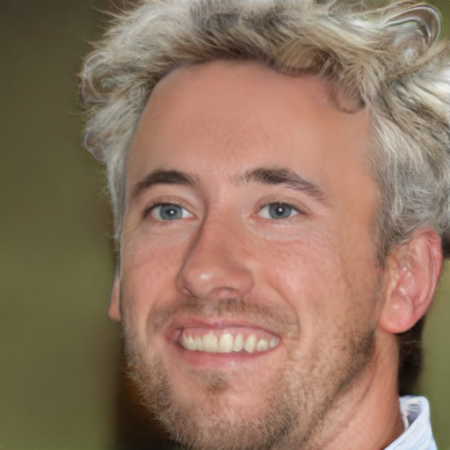

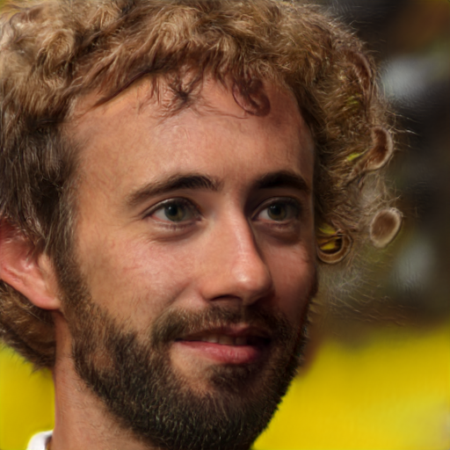

100%|███████████████████████████████████████| 176M/176M [00:00<00:00, 89.0GB/s]


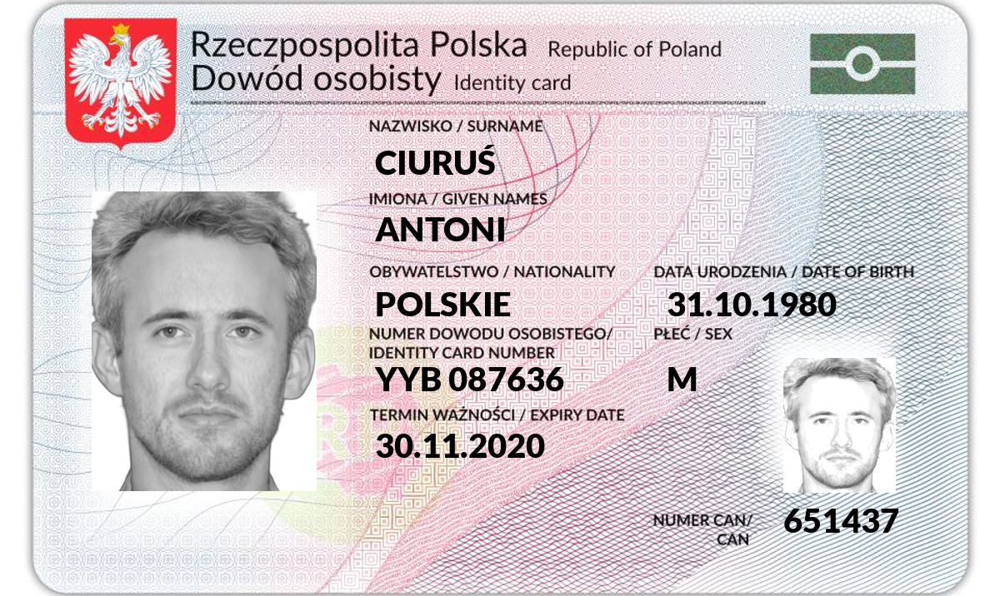

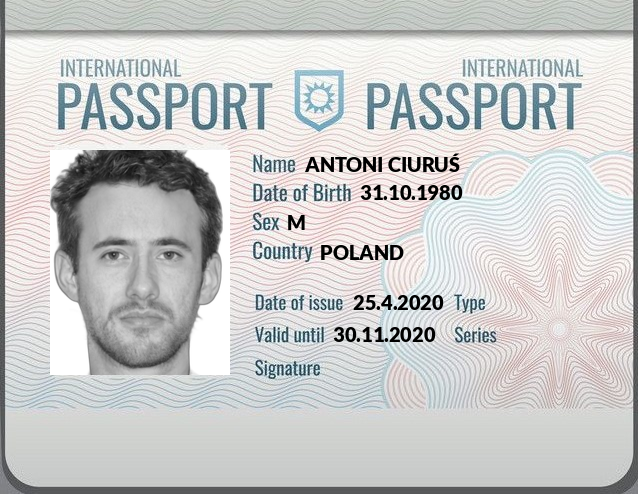

Image: 1


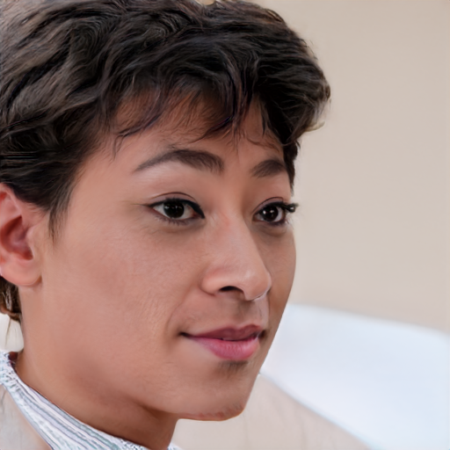

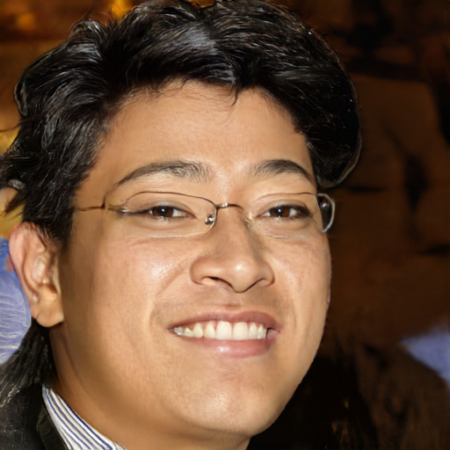

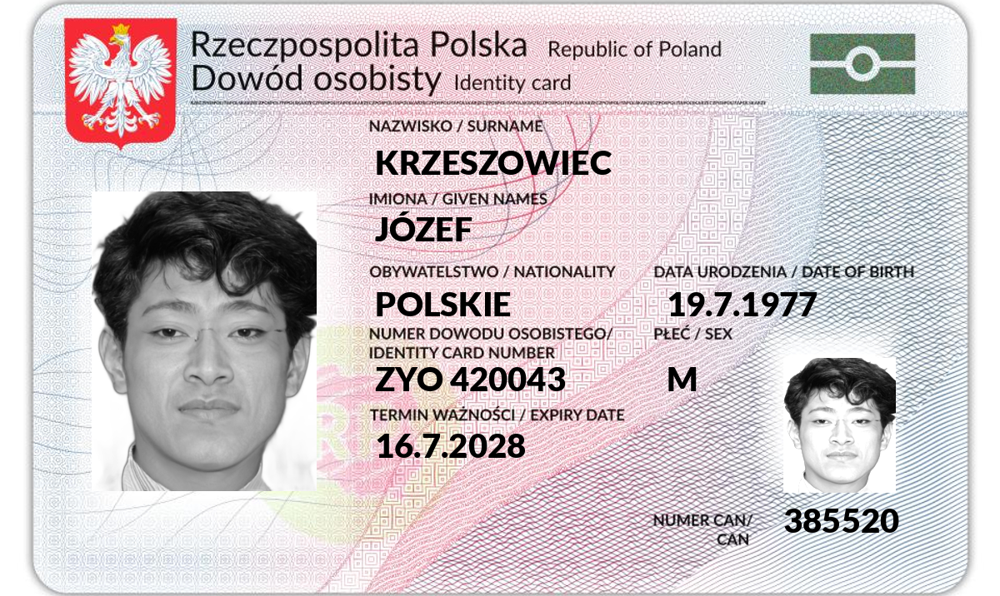

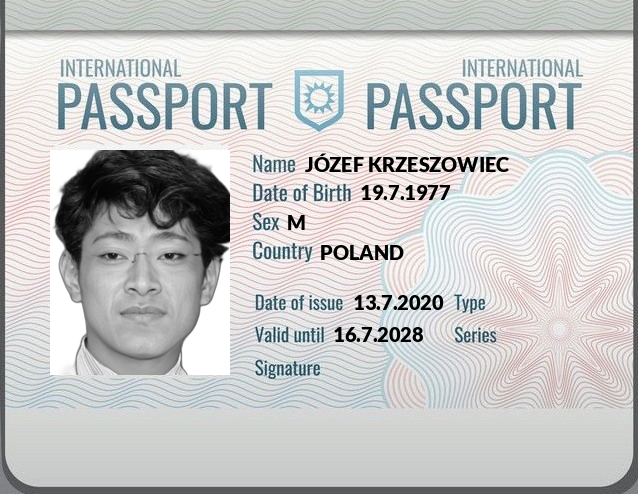

Image: 2


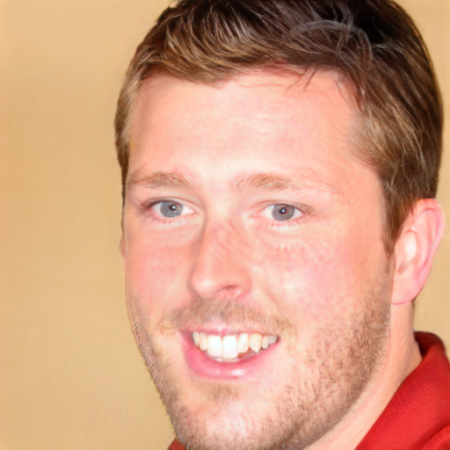

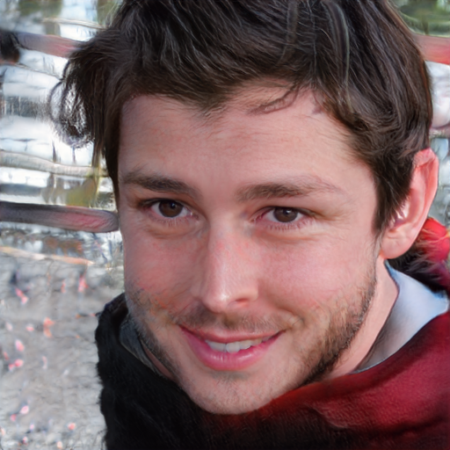

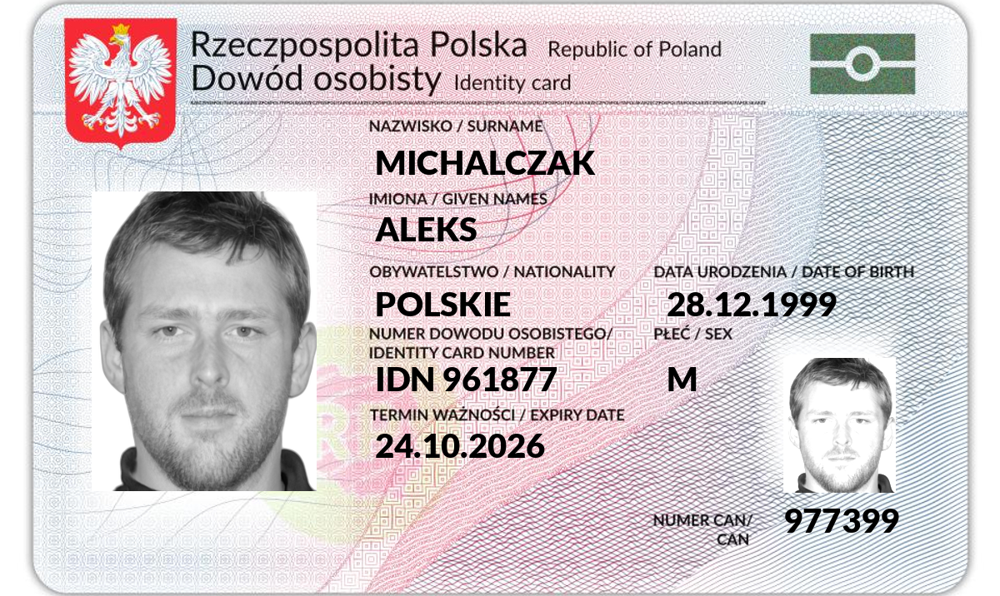

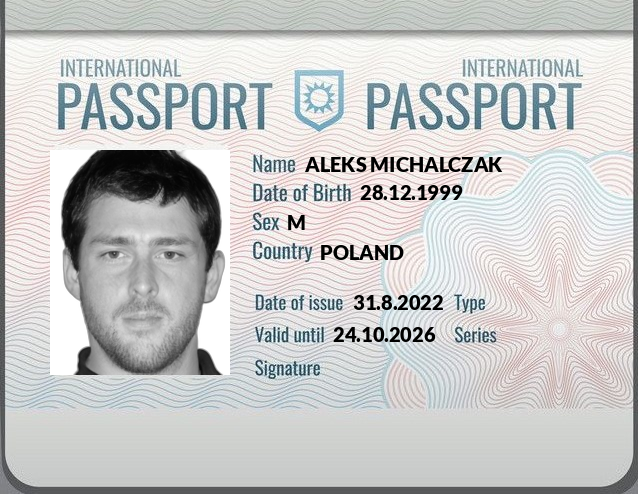

Image: 3


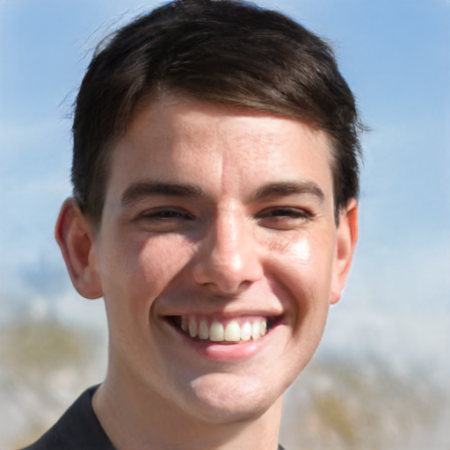

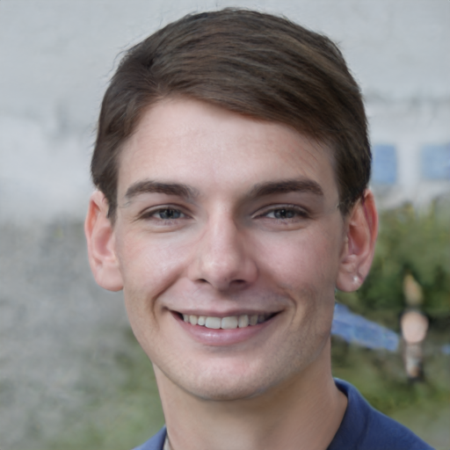

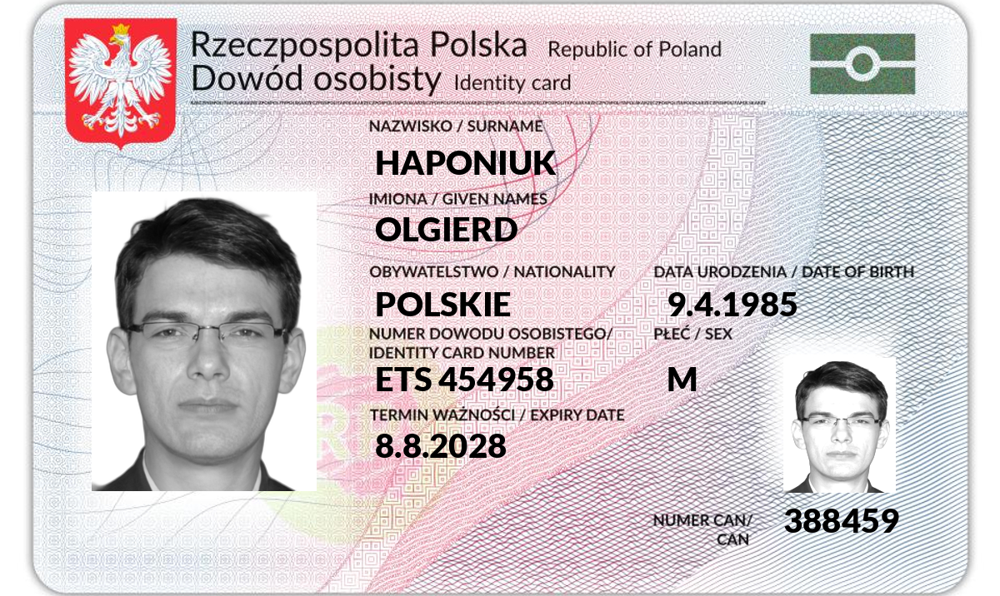

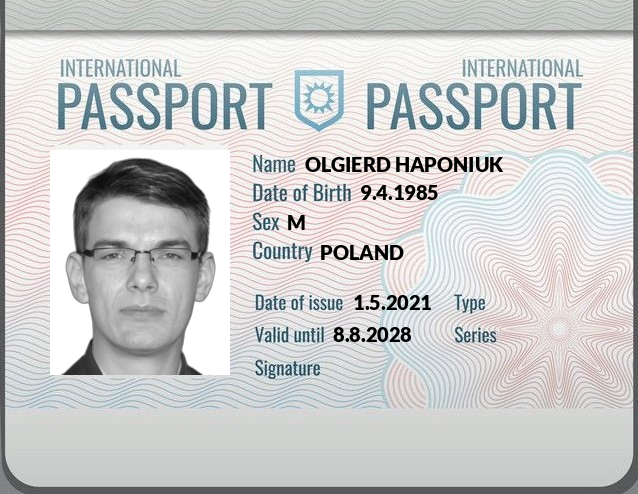

Image: 4


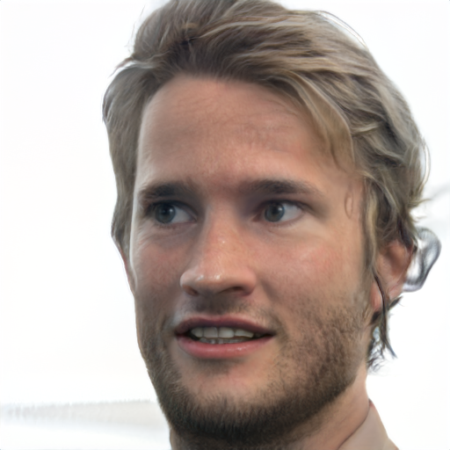

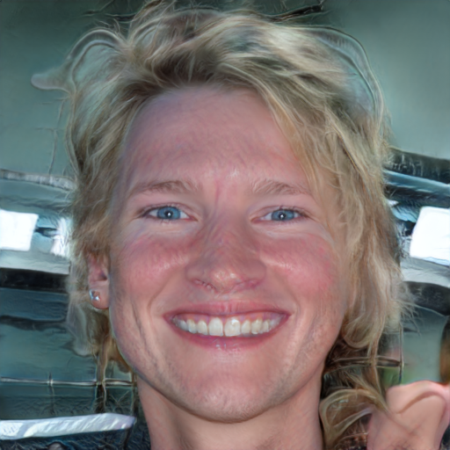

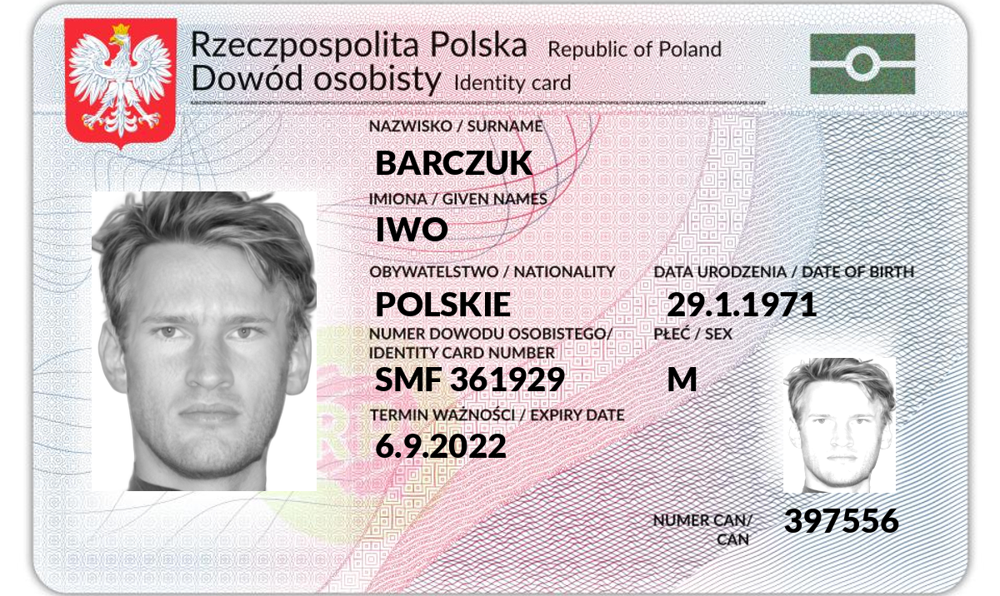

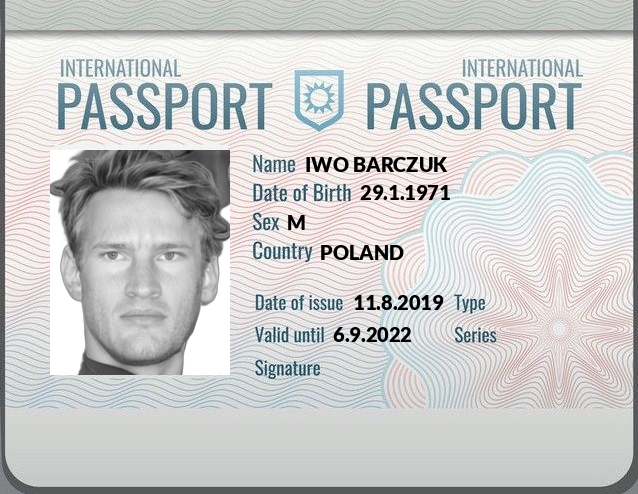

In [11]:
seed = 2
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

fake = Faker('pl_PL')
fake.seed_instance(seed)

batch_size = 2
truncation = 1
resize = 450
age_control = torch.tensor([[30.]])
strength = 0.5
illumination_control = torch.tensor([sh_eval_basis_1(0, 0, 1)]) * strength
pose_control = torch.tensor([[0., 0., 0.]])
expression_control=torch.tensor([expressions[16]])

epochs = 5

for person_number in range(epochs):
    print(f"Image: {person_number}")
    image_tensors, _, source_latent_w = controller.gen_batch(batch_size=batch_size, truncation=truncation)
    modified_latent_w = source_latent_w.clone()

    id_w_latents = controller.get_group_w_latent(modified_latent_w, group='id')
    modified_latent_w = controller.insert_group_w_latent(modified_latent_w, id_w_latents[0], group='id')
    image_tensors, _, modified_latent_w = controller.gen_batch_by_controls(batch_size=batch_size, latent=modified_latent_w, input_is_latent=True, age=age_control)
    generated_photos = images_from_tensors(image_tensors)
    display(generated_photos[0])
    display(generated_photos[1])

    modified_latent_w = source_latent_w.clone()
    id_w_latents = controller.get_group_w_latent(modified_latent_w, group='id')
    modified_latent_w = controller.insert_group_w_latent(modified_latent_w, id_w_latents[0], group='id')
    image_tensors, _, _ = controller.gen_batch_by_controls(batch_size=batch_size, latent=modified_latent_w, input_is_latent=True, age=age_control, orientation=pose_control, expression=expression_control, gamma=illumination_control)
    document_images = images_from_tensors(image_tensors)

    document_template = Image.open(f"{resources_path}/document_template.jpg")
    passport_template = Image.open(f"{resources_path}/passport_template.jpg")
    generated_document, generated_passport = add_info_for_document(document_images[0], document_template, document_images[1], passport_template, person_number, fake)
    display(generated_document)
    display(generated_passport)